# Load Packages

In [1]:
import os
import pandas as pd
import re
import numpy as np
import netCDF4 as nc
from PIL import Image
import datetime 
import imageio
import os 
import matplotlib.pyplot as plt
import math
import xarray as xr

# Load S3 Data (NetCDF Format)
CHL data from https://data.marine.copernicus.eu/product/OCEANCOLOUR_ATL_BGC_L3_MY_009_113/download?dataset=cmems_obs-oc_atl_bgc-plankton_my_l3-multi-1km_P1D_202303 

In [81]:
# data from 26/7/2023
ds = nc.Dataset("~data/cmems_obs-oc_atl_bgc-plankton_my_l3-multi-1km_P1D_1691157822303.nc")

# data from 17/7/2023
ds = nc.Dataset("~data/cmems_obs-oc_atl_bgc-plankton_my_l3-multi-1km_P1D_1691160929337.nc")

In [82]:
for dim in ds.dimensions.values():
    print(dim)

<class 'netCDF4._netCDF4.Dimension'>: name = 'time', size = 1
<class 'netCDF4._netCDF4.Dimension'>: name = 'lat', size = 1199
<class 'netCDF4._netCDF4.Dimension'>: name = 'lon', size = 1379


In [83]:
# data from 26/7/2023
ds = xr.open_dataset("~data/cmems_obs-oc_atl_bgc-plankton_my_l3-multi-1km_P1D_1691157822303.nc")

# data from 17/7/2023
ds = xr.open_dataset("~data/cmems_obs-oc_atl_bgc-plankton_my_l3-multi-1km_P1D_1691160929337.nc")
ds

<xarray.Dataset>
Dimensions:  (time: 1, lat: 1199, lon: 1379)
Coordinates:
  * lon      (lon) float32 -11.83 -11.82 -11.81 -11.8 ... 2.505 2.516 2.526
  * time     (time) datetime64[ns] 2023-07-17
  * lat      (lat) float32 61.54 61.53 61.52 61.51 ... 49.09 49.08 49.07 49.06
Data variables:
    CHL      (time, lat, lon) float32 ...
Attributes: (12/92)
    FROM_ORIGINAL_FILE__lon_step:                     0.010416667
    keywords:                                         EARTH SCIENCE > OCEANS ...
    cmems_product_id:                                 OCEANCOLOUR_ATL_BGC_L3_...
    FROM_ORIGINAL_FILE__lat_step:                     0.010416667
    grid_mapping:                                     Equirectangular
    title:                                            cmems_obs-oc_atl_bgc-pl...
    ...                                               ...
    FROM_ORIGINAL_FILE__westernmost_longitude:        -46.0
    geospatial_vertical_positive:                     up
    date_created:                                     2023-08-04T07:30:52Z
    nb_valid_bins:                                    9179494
    pct_valid_bins:                                   36.700031152767544
    _CoordSysBuilder:                                 ucar.nc2.dataset.conv.C...

In [84]:
non_missing_vals = np.count_nonzero(~np.isnan(ds['CHL'][0, :, :].data))
print(f'Proportion of non missing values: {non_missing_vals}/{1145*1318}')

Proportion of non missing values: 612532/1509110


# Load Site Labels

In [85]:
sites_df = pd.read_csv('~data/site.csv')
sites = [[row['label'], row['lat'], row['long']] for index, row in sites_df.iterrows()]
sites[:10]

[['Ainsdale', 53.60792741, -3.063987798],
 ['Allonby', 54.76803625, -3.434625292],
 ['Allonby South', 54.74396018, -3.456453603],
 ['Amble Links', 55.32565184, -1.552400659],
 ['Anderby', 53.25977424, 0.325519541],
 ["Anstey's Cove (Torquay)", 50.47184615, -3.501089731],
 ['Babbacombe', 50.47907733, -3.509409069],
 ['Bamburgh Castle', 55.61096248, -1.707903477],
 ['Bantham', 50.2789762, -3.878799945],
 ['Beachlands Central', 50.78359334, -0.989275631]]

# Find NetCDF Data for each site

In [86]:
lats = ds['lat'][:].data
lons = ds['lon'][:].data

chls = []

for i in range(len(sites_df)):
    site = sites[i]
    site_name, lat, lon = site[0], site[1], site[2]
    lat_index = np.argmin(np.abs(lats - lat))
    lon_index = np.argmin(np.abs(lons - lon))
    
    chl = ds['CHL'][0, lat_index, lon_index].data
    chls.append(chl)

chls

[array(nan, dtype=float32),
 array(nan, dtype=float32),
 array(nan, dtype=float32),
 array(nan, dtype=float32),
 array(nan, dtype=float32),
 array(nan, dtype=float32),
 array(nan, dtype=float32),
 array(nan, dtype=float32),
 array(4.8499165, dtype=float32),
 array(nan, dtype=float32),
 array(3.5509336, dtype=float32),
 array(nan, dtype=float32),
 array(nan, dtype=float32),
 array(nan, dtype=float32),
 array(3.1472244, dtype=float32),
 array(nan, dtype=float32),
 array(nan, dtype=float32),
 array(4.5280833, dtype=float32),
 array(4.9107404, dtype=float32),
 array(nan, dtype=float32),
 array(nan, dtype=float32),
 array(nan, dtype=float32),
 array(nan, dtype=float32),
 array(1.5209192, dtype=float32),
 array(4.5347958, dtype=float32),
 array(9.057777, dtype=float32),
 array(nan, dtype=float32),
 array(2.7865586, dtype=float32),
 array(nan, dtype=float32),
 array(nan, dtype=float32),
 array(6.6602597, dtype=float32),
 array(nan, dtype=float32),
 array(nan, dtype=float32),
 array(nan, dtype

In [46]:
# Number of missing values
chls = pd.Series(chls)
print(f'Missing values for CHLs: {sum([np.isnan(chl) for chl in chls])}/430')

Missing values for CHLs: 405/430


# Preliminary 2D Plots with data from 26/7/2023 

In [87]:
# General Function
def site_local_plot(ds, site_name, variable, dimension = 10):
    '''
    ds: name of a .nc file, dataset for a single day of data (string)
    site_name: one of the 430 site names (string)
    variable: 'CHL', 'TUR', 'SPM' (string)
    dimension: creates dimension*2+1 square plot (integer)
    '''
    lat = float(sites_df[sites_df['label'] == site_name]['lat'])
    lon = float(sites_df[sites_df['label'] == site_name]['long'])
    
    lats = ds['lat'][:].data
    lons = ds['lon'][:].data
    
    lat_index = np.argmin(np.abs(lats - lat))
    lon_index = np.argmin(np.abs(lons - lon))
    
    i = dimension
    arr = ds[f'{variable}'][0,lat_index-i:lat_index+i+1,lon_index-i:lon_index+i+1].data
    
    plt.imshow(arr, cmap='viridis', interpolation='nearest')
    
    # Add highlighted point of Site Location
    plt.scatter(i, i, s=100, marker='o', facecolors='r')
    
    # Plot colorbar
    plt.colorbar()
    
    # Changing Ticks to match latitude and longitude
    new_xticks = [round(lons[j], 3) for j in np.arange(lon_index-i, lon_index+i+1)][::5]
    plt.xticks(range(len(new_xticks)*5)[::5], new_xticks)
    new_yticks = [round(lats[j], 3) for j in np.arange(lat_index-i, lat_index+i+1)][::5]
    plt.yticks(range(len(new_yticks)*5)[::5], new_yticks)
    
    # Add Title
    plt.title(f'{site_name}, {variable}')
    
    # Change Background colour to black
    plt.rcParams['axes.facecolor'] = 'black'

/var/folders/30/yf_8fbts0tx6rpv150kb_b3m0000gn/T/ipykernel_7786/3916389375.py:9: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  lat = float(sites_df[sites_df['label'] == site_name]['lat'])
/var/folders/30/yf_8fbts0tx6rpv150kb_b3m0000gn/T/ipykernel_7786/3916389375.py:10: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  lon = float(sites_df[sites_df['label'] == site_name]['long'])


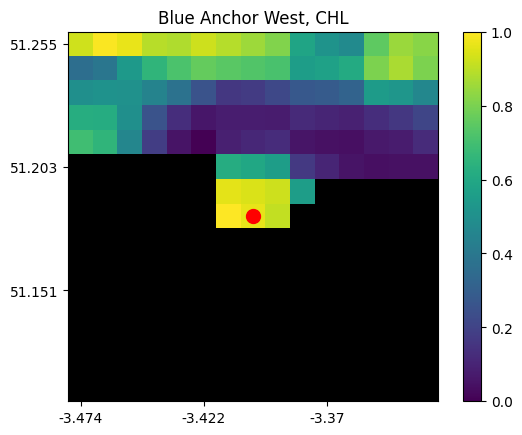

In [88]:
site_local_plot(ds, 'Blue Anchor West', 'CHL', 7)

In [89]:
%%time
fig, axs = plt.subplots(nrows=108, ncols=4, figsize=(25, 500))
site_names = sites_df['label']

for i, ax in enumerate(axs.flatten()):
    if i < 430:
        site_local_plot(ds, site_names[i], 'CHL', 7)
        plt.sca(ax)
        plt.xticks([])
        plt.yticks([])
        ax.set_facecolor('black')
    else:
        ax.axis('off')
        
plt.subplots_adjust(wspace=0.2, hspace=0.6)
plt.show()

/var/folders/30/yf_8fbts0tx6rpv150kb_b3m0000gn/T/ipykernel_7786/3916389375.py:9: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  lat = float(sites_df[sites_df['label'] == site_name]['lat'])
/var/folders/30/yf_8fbts0tx6rpv150kb_b3m0000gn/T/ipykernel_7786/3916389375.py:10: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  lon = float(sites_df[sites_df['label'] == site_name]['long'])


CPU times: user 25.6 s, sys: 614 ms, total: 26.2 s
Wall time: 26 s


# Plots Comparing two Datasets

In [90]:
# Function to Calculate Comparison 
def comparison_plot(ds1, ds2, site_name, variable, dimension = 5):
    '''
    Assumes that lat_index and lon_index snaps the lat and lon point to the same grid across datasets
    '''
    lat = float(sites_df[sites_df['label'] == site_name]['lat'])
    lon = float(sites_df[sites_df['label'] == site_name]['long'])
    
    # First dataset
    lats = ds1['lat'][:].data
    lons = ds1['lon'][:].data
    
    lat_index = np.argmin(np.abs(lats - lat))
    lon_index = np.argmin(np.abs(lons - lon))
    
    i = dimension
    arr1 = ds1[f'{variable}'][0,lat_index-i:lat_index+i+1,lon_index-i:lon_index+i+1].data
    
    # Second dataset
    lats = ds2['lat'][:].data
    lons = ds2['lon'][:].data
    
    lat_index = np.argmin(np.abs(lats - lat))
    lon_index = np.argmin(np.abs(lons - lon))
    
    i = dimension
    arr2 = ds2[f'{variable}'][0,lat_index-i:lat_index+i+1,lon_index-i:lon_index+i+1].data
    
    # Mask for when the arrays have the same values
    mask_same = np.logical_xor(np.isnan(arr1), np.isnan(arr2))
    mask_same = np.logical_not(mask_same)
    
    # Mask for when the arrays have the same values
    mask_same = np.logical_xor(np.isnan(arr1), np.isnan(arr2))
    mask_same = np.logical_not(mask_same)

    # Plot
    plt.imshow(mask_same, cmap='Set1')
    
    # Colorbar
    plt.colorbar()

    # Changing Ticks to match latitude and longitude
    new_xticks = [round(lons[j], 3) for j in np.arange(lon_index-i, lon_index+i+1)][::5]
    plt.xticks(range(len(new_xticks)*5)[::5], new_xticks)
    new_yticks = [round(lats[j], 3) for j in np.arange(lat_index-i, lat_index+i+1)][::5]
    plt.yticks(range(len(new_yticks)*5)[::5], new_yticks)

    # Add Title
    plt.title(f'{site_name}, {variable}')

In [94]:
# Load Second Dataset
# data from 26/07/2023
ds26 = nc.Dataset("~data/cmems_obs-oc_atl_bgc-plankton_my_l3-multi-1km_P1D_1691157822303.nc")

# data from 14/03/2023
ds14 = nc.Dataset("~data/cmems_obs-oc_atl_bgc-plankton_my_l3-multi-1km_P1D_1691162049216.nc")

/var/folders/30/yf_8fbts0tx6rpv150kb_b3m0000gn/T/ipykernel_7786/2320999897.py:6: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  lat = float(sites_df[sites_df['label'] == site_name]['lat'])
/var/folders/30/yf_8fbts0tx6rpv150kb_b3m0000gn/T/ipykernel_7786/2320999897.py:7: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  lon = float(sites_df[sites_df['label'] == site_name]['long'])


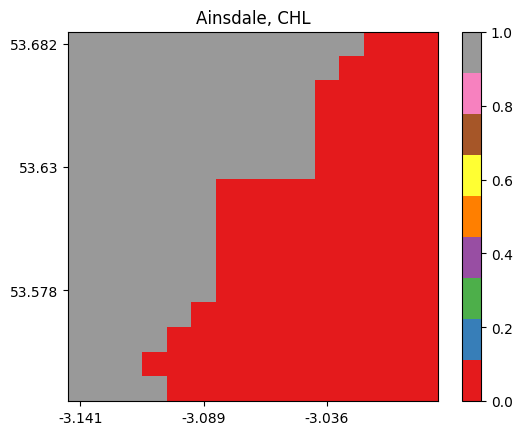

In [96]:
site = sites_df['label'][0]
comparison_plot(ds, ds14, site, 'CHL', 7)

In [97]:
%%time
fig, axs = plt.subplots(nrows=108, ncols=4, figsize=(25, 500))
site_names = sites_df['label']

for i, ax in enumerate(axs.flatten()):
    if i < 430:
        comparison_plot(ds, ds14, site_names[i], 'CHL', 7)
        plt.sca(ax)
        plt.xticks([])
        plt.yticks([])
        ax.set_facecolor('black')
    else:
        ax.axis('off')
        
plt.subplots_adjust(wspace=0.2, hspace=0.6)
plt.show()

/var/folders/30/yf_8fbts0tx6rpv150kb_b3m0000gn/T/ipykernel_7786/2320999897.py:6: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  lat = float(sites_df[sites_df['label'] == site_name]['lat'])
/var/folders/30/yf_8fbts0tx6rpv150kb_b3m0000gn/T/ipykernel_7786/2320999897.py:7: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  lon = float(sites_df[sites_df['label'] == site_name]['long'])


CPU times: user 24.3 s, sys: 914 ms, total: 25.2 s
Wall time: 25.7 s
